# <font color=purple>**Unsupervised Learning Cars MPG Assignment**</font>

## Unsupervised Learning Project
### Data Description:
The data contains features extracted from the silhouette of vehicles in
different angles. Four "Corgie" model vehicles were used for the experiment: a
double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars.
This particular combination of vehicles was chosen with the expectation that
the bus, van and either one of the cars would be readily distinguishable, but it
would be more difficult to distinguish between the cars.
### Domain:
Object recognition
### Context:
The purpose is to classify a given silhouette as one of three types of vehicle,
using a set of features extracted from the silhouette. The vehicle may be
viewed from one of many different angles.
### Attribute Information:
● All the features are geometric features extracted from the silhouette.

● All are numeric in nature.
### Learning Outcomes:
● Exploratory Data Analysis

● Reduce number dimensions in the dataset with minimal information loss

● Train a model using Principal Components
### Objective:
Apply dimensionality reduction technique – PCA and train a model using
principal components instead of training the model using just the raw data.
Proprietary content. ©Great Learning. All Rights Reserved. Unauthorized use or distribution prohibited
### Steps and tasks:
#### 1. Data pre-processing – 
Perform all the necessary preprocessing on the
data ready to be fed to an Unsupervised algorithm 
#### 2. Understanding the attributes - 
Find relationship between different
attributes (Independent variables) and choose carefully which all
attributes have to be a part of the analysis and why 
#### 3. Split the data into train and test 
(Suggestion: specify “random state” if you are using train_test_split from Sklearn) 
#### 4. Train a Support vector machine
using the train set and get the accuracy on the test set
#### 5. Use PCA 
from Scikit learn, extract Principal Components that capture about 95% of the variance in the data 
#### 6. Train a Support vector machine
using the Principal Components and get the accuracy on the test set 
#### 7. Compare the accuracy scores
of Support vector machines – one trained using raw data and the other using Principal Components, and mention your findings

#### 8. Optional task : clustering.
a. Apply Kmeans clustering on the principal components train data.
Get the cluster labels and append to the same data as a column.
Similarly, use the ‘predict’ function of Kmeans clustering to get the
clusters on the PC test data and append the cluster labels.

b. using this new train and test data (the only difference is that there
is a new column with cluster labels), train and evaluate an SVM
model

c. Write down your comments on the outcome. Whether there is an
improvement in the metrics or not, after using the cluster
information in our data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import scipy.stats as stats
import math

from sklearn import preprocessing
from sklearn import metrics
from sklearn import model_selection
from sklearn import feature_selection
from sklearn import decomposition
from sklearn import svm
from sklearn import cluster 


from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_graphviz

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import StackingRegressor



from statsmodels.stats.outliers_influence import variance_inflation_factor
from os import system
from IPython.display import Image 
from sklearn import tree


import warnings
warnings.filterwarnings('ignore')

##### <font color=blue>*This is done to make Jupyter show all the columns. Otherwise Jupyter hides columns*</font>

In [2]:
pd.set_option('max_columns', None)

### <font color=blue>*Loading the Dataset*</font>

In [3]:
missing_value_formats = ["n.a.","?","NA","n/a","na","N.A.","nan","NAN","--"," ", "  ","@",".","-"]
original_dataset = pd.read_csv('UL-Assignment-02-vehicle.csv',na_values=missing_value_formats)

In [4]:
original_dataset.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

## <font color=blue>1. - Data pre-processing – Perform all the necessary preprocessing on the data ready to be fed to an Unsupervised algorithm</font>

### <font color=red>Basic Statistical Analysis</font>

In [5]:
new_dataset = original_dataset.copy()

In [6]:
new_dataset.shape

(846, 19)

##### <font color=blue>*There are 846 records & 19 features*</font>

In [7]:
new_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

##### <font color=blue>*So out of 19 features, 14 are 64 bit float, 4 are 64 bit integer & 1 is object*</font>
##### <font color=blue>*Except the class name, all other features are numerical. So we might need to make all numerical types features to have same dtype*</font>

##### <font color=blue>*First & Last 5 records*</font>

In [8]:
new_dataset.head(5)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [9]:
new_dataset.tail(5)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
841,93,39.0,87.0,183.0,64.0,8,169.0,40.0,20.0,134,200.0,422.0,149.0,72.0,7.0,25.0,188.0,195,car
842,89,46.0,84.0,163.0,66.0,11,159.0,43.0,20.0,159,173.0,368.0,176.0,72.0,1.0,20.0,186.0,197,van
843,106,54.0,101.0,222.0,67.0,12,222.0,30.0,25.0,173,228.0,721.0,200.0,70.0,3.0,4.0,187.0,201,car
844,86,36.0,78.0,146.0,58.0,7,135.0,50.0,18.0,124,155.0,270.0,148.0,66.0,0.0,25.0,190.0,195,car
845,85,36.0,66.0,123.0,55.0,5,120.0,56.0,17.0,128,140.0,212.0,131.0,73.0,1.0,18.0,186.0,190,van


#### <font color=blue>*Checking for missing values*</font>

In [10]:
new_dataset.isnull().any()

compactness                    False
circularity                     True
distance_circularity            True
radius_ratio                    True
pr.axis_aspect_ratio            True
max.length_aspect_ratio        False
scatter_ratio                   True
elongatedness                   True
pr.axis_rectangularity          True
max.length_rectangularity      False
scaled_variance                 True
scaled_variance.1               True
scaled_radius_of_gyration       True
scaled_radius_of_gyration.1     True
skewness_about                  True
skewness_about.1                True
skewness_about.2                True
hollows_ratio                  False
class                          False
dtype: bool

In [11]:
new_dataset.isna().any()

compactness                    False
circularity                     True
distance_circularity            True
radius_ratio                    True
pr.axis_aspect_ratio            True
max.length_aspect_ratio        False
scatter_ratio                   True
elongatedness                   True
pr.axis_rectangularity          True
max.length_rectangularity      False
scaled_variance                 True
scaled_variance.1               True
scaled_radius_of_gyration       True
scaled_radius_of_gyration.1     True
skewness_about                  True
skewness_about.1                True
skewness_about.2                True
hollows_ratio                  False
class                          False
dtype: bool

##### <font color=blue>*Many features have values missing.*</font>

##### <font color=blue>*Before working on imputing, first check distributions.*</font>

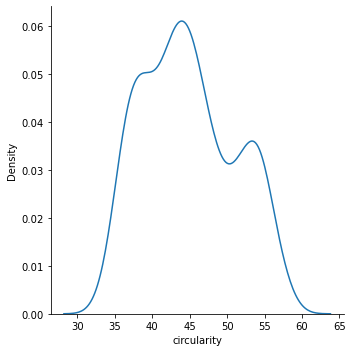

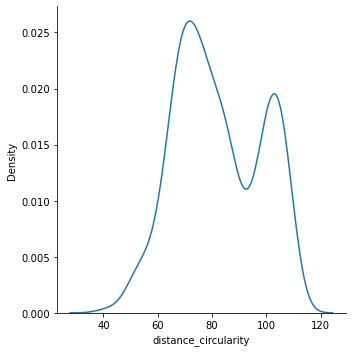

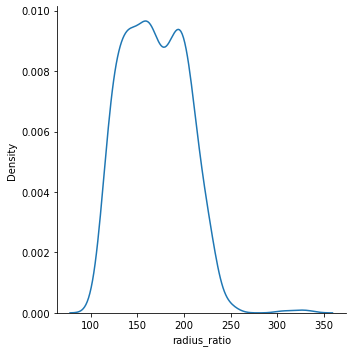

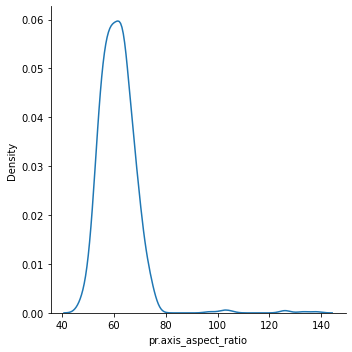

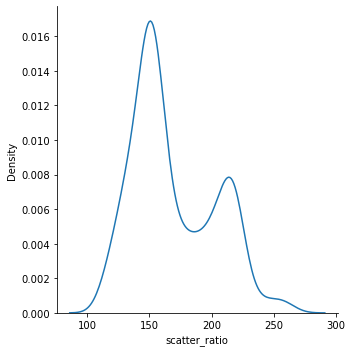

...

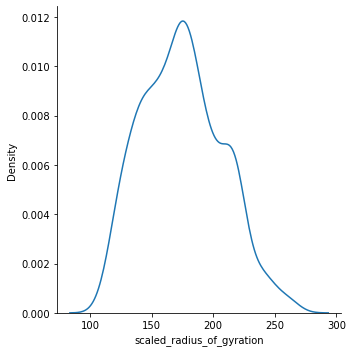

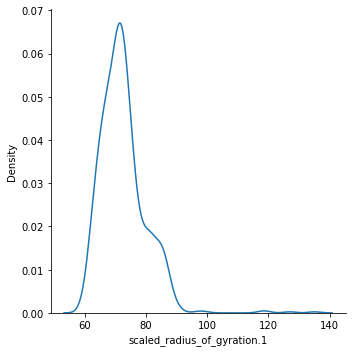

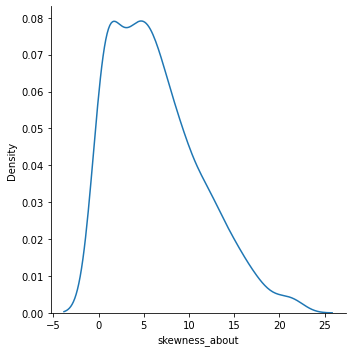

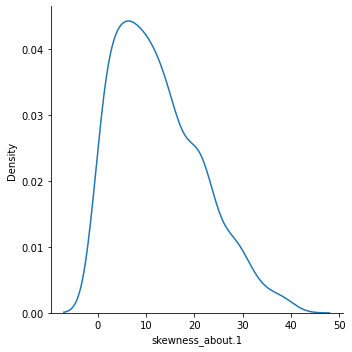

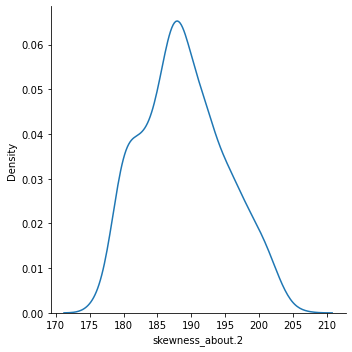

In [12]:
for feature in new_dataset.columns:
    if(new_dataset[feature].isna().any()):
        sns.displot(data=new_dataset, x=feature, kind="kde")
        plt.show()

##### <font color=blue>*All of these features with missing values has multiple peaks and skewed. So its better to use median than mean to impute.*</font>

In [13]:
for feature in new_dataset.columns:
    if(new_dataset[feature].isna().any()):
        print(feature)
        for i in np.arange(0,len(new_dataset)):
            value = new_dataset[feature][i]
            if(math.isnan(value)):
                print(i,value)

circularity
5 nan
105 nan
118 nan
266 nan
396 nan
distance_circularity
35 nan
118 nan
207 nan
319 nan
radius_ratio
9 nan
78 nan
159 nan
287 nan
345 nan
467 nan
pr.axis_aspect_ratio
19 nan
222 nan
scatter_ratio
249 nan
elongatedness
215 nan
pr.axis_rectangularity
70 nan
237 nan
273 nan
scaled_variance
105 nan
372 nan
522 nan
scaled_variance.1
308 nan
496 nan
scaled_radius_of_gyration
207 nan
266 nan
scaled_radius_of_gyration.1
66 nan
77 nan
192 nan
329 nan
skewness_about
66 nan
141 nan
177 nan
222 nan
249 nan
285 nan
skewness_about.1
105 nan
skewness_about.2
419 nan


In [14]:
for feature in new_dataset.columns:
    if(new_dataset[feature].isna().any()):
        new_dataset[feature].fillna(new_dataset[feature].median(),inplace=True)

### <font color=blue>*Checking for missing value again*</font>

In [15]:
new_dataset.isnull().any()

compactness                    False
circularity                    False
distance_circularity           False
radius_ratio                   False
pr.axis_aspect_ratio           False
max.length_aspect_ratio        False
scatter_ratio                  False
elongatedness                  False
pr.axis_rectangularity         False
max.length_rectangularity      False
scaled_variance                False
scaled_variance.1              False
scaled_radius_of_gyration      False
scaled_radius_of_gyration.1    False
skewness_about                 False
skewness_about.1               False
skewness_about.2               False
hollows_ratio                  False
class                          False
dtype: bool

#### <font color=blue>*Checking for duplicates*</font>

In [16]:
new_dataset.duplicated().any()

False

##### <font color=blue>*Making all numerical features of same type.*</font>

In [17]:
class_col = new_dataset.pop('class')

In [18]:
new_dataset = new_dataset.astype('float64')

In [19]:
new_dataset.insert(18,class_col.name,class_col)

In [20]:
new_dataset.dtypes

compactness                    float64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio        float64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity      float64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                  float64
class                           object
dtype: object

##### <font color=blue>*There are no duplicate values*</font>

#### <font color=blue>*Analysis of Basic Stats*</font>

In [21]:
new_dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.874704,33.401356,104.0,141.00,167.0,195.00,333.0
pr.axis_aspect_ratio,846.0,61.677305,7.882188,47.0,57.00,61.0,65.00,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.00,55.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


##### <font color=blue>*Apart from hollows_ratio, all other features have mean > median.This indicates positive skewness. Feature hollows_ratio is negatively skewed. There are outliers too.*</font>

In [22]:
GroupByClass = new_dataset.groupby('class')

In [23]:
GroupByClass.mean()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
class,,,,,,,,,,,,,,,,,,
bus,91.591743,44.963303,76.811927,165.720183,63.403670,7.013761,170.022936,40.114679,20.577982,146.701835,192.889908,448.894495,180.963303,77.071101,4.816514,10.211009,187.811927,191.325688
car,96.184149,46.030303,88.878788,180.496503,60.993007,8.825175,180.997669,38.104895,21.508159,149.967366,197.806527,499.904429,179.613054,69.935897,7.121212,15.160839,189.470862,197.582751
van,90.562814,42.070352,73.281407,147.276382,61.261307,9.713568,141.537688,47.939698,18.582915,145.175879,164.040201,298.201005,157.276382,72.778894,6.417085,9.698492,188.939698,196.145729


##### <font color=blue>*Average compactness of car is around 96 which has a good difference with bus and van. So, this compactness feature can differentiate car from other two vehicles. We can draw similar inferences for other features.*</font>

#### <font color=blue>*Checking for skewness*</font>

In [24]:
new_dataset.skew()

compactness                    0.381271
circularity                    0.264928
distance_circularity           0.108718
radius_ratio                   0.397572
pr.axis_aspect_ratio           3.835392
max.length_aspect_ratio        6.778394
scatter_ratio                  0.608710
elongatedness                  0.046951
pr.axis_rectangularity         0.774406
max.length_rectangularity      0.256359
scaled_variance                0.655598
scaled_variance.1              0.845345
scaled_radius_of_gyration      0.279910
scaled_radius_of_gyration.1    2.089979
skewness_about                 0.780813
skewness_about.1               0.689014
skewness_about.2               0.249985
hollows_ratio                 -0.226341
dtype: float64

##### <font color=blue>*Features max.length_aspect_ratio pr.axis_aspect_ratio & scaled_radius_of_gyration.1 are highly skewed positively.*</font>

## <font color=blue>2. - Understanding the attributes - Find relationship between different attributes (Independent variables) and choose carefully which all attributes have to be a part of the analysis and why</font>

### <font color=red>Univariate Analysis</font>

#### <font color=blue>*Analysis of distributions of each of the continuous features*</font>

compactness  Mean - Median =  0.6785
compactness  3 Standard Deviation below mean  68.9751
compactness  3 Standard Deviation above mean  118.3819


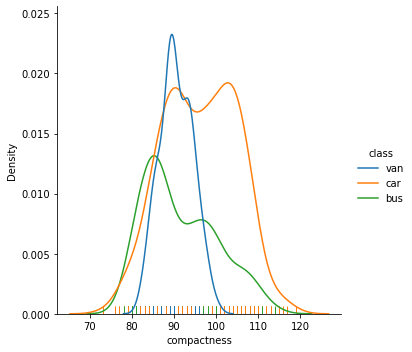

In [25]:
feature = 'compactness'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()
    

##### <font color=blue>*99% data lies between 68 & 118.Spread is a bit of higher side. Positively skewed. Has outliers on both sides. Contains multiple peaks. Car has good separation from rest of the two hence it can be distinguished better.*</font>

circularity  Mean - Median =  0.8239
circularity  3 Standard Deviation below mean  26.4211
circularity  3 Standard Deviation above mean  63.2267


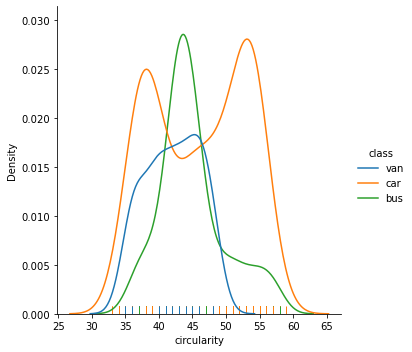

In [26]:
feature = 'circularity'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()
    

##### <font color=blue>*99% data lies between 26 & 63.Again spread is a bit of higher side. Positively skewed. Not much of the outliers. Contains multiple peaks. Looks like three classes has fine separation among themselves.*</font>

distance_circularity  Mean - Median =  2.1005
distance_circularity  3 Standard Deviation below mean  34.8758
distance_circularity  3 Standard Deviation above mean  129.3252


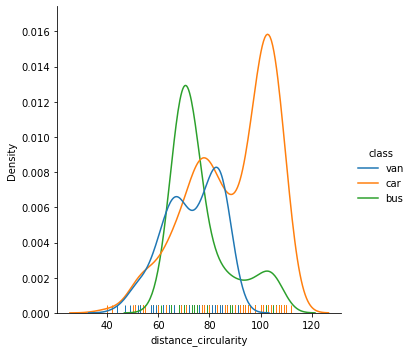

In [27]:
feature = 'distance_circularity'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()
    

##### <font color=blue>*99% data lies between 34 & 129 .Spread is high. Positively skewed. Has outliers. Contains multiple peaks. Car again has good separation from rest of the two hence it can be distinguished better. Bus and Van also looks separable here.*</font>

radius_ratio  Mean - Median =  1.8747
radius_ratio  3 Standard Deviation below mean  68.6706
radius_ratio  3 Standard Deviation above mean  269.0788


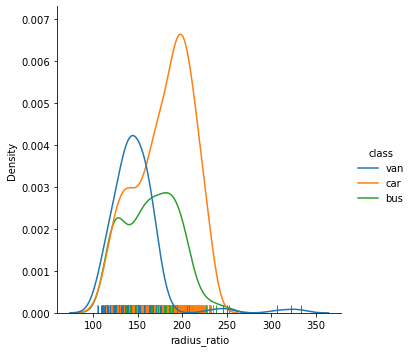

In [28]:
feature = 'radius_ratio'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()
    

##### <font color=blue>*99% data lies between 68 & 269 .Spread is very high. Quite positively skewed. Has many outliers. Contains multiple peaks. Car again has good separation from rest of the two hence it can be distinguished better. Bus and Van also looks separable here.*</font>

pr.axis_aspect_ratio  Mean - Median =  0.6773
pr.axis_aspect_ratio  3 Standard Deviation below mean  38.0307
pr.axis_aspect_ratio  3 Standard Deviation above mean  85.3239


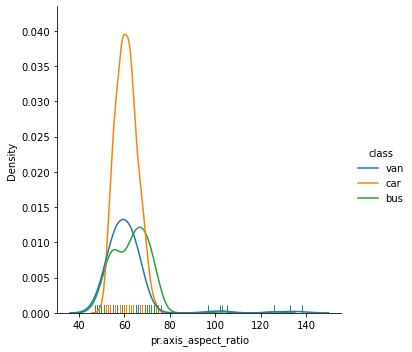

In [29]:
feature = 'pr.axis_aspect_ratio'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()
    

##### <font color=blue>*99% data lies between 38 & 85 .Spread is not so much. Quite positively skewed. Has many outliers. Contains multiple peaks but car has gaussian spread. Car again has good separation from rest of the two hence it can be distinguished better. Bus and Van also looks separable here but Car & Van are hard to separate.*</font>

max.length_aspect_ratio  Mean - Median =  0.5674
max.length_aspect_ratio  3 Standard Deviation below mean  -5.2362
max.length_aspect_ratio  3 Standard Deviation above mean  22.371


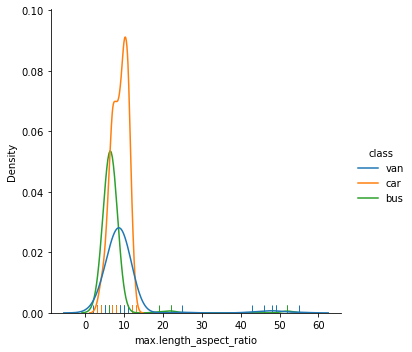

In [30]:
feature = 'max.length_aspect_ratio'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()
    

##### <font color=blue>*99% data lies between -5 & 22 .Spread is not so much. Very positively skewed. Has many outliers. Car contains multiple peaks. Car again has good separation from rest of the two. Bus and Van looks somewhat separable here.*</font>

scatter_ratio  Mean - Median =  11.8877
scatter_ratio  3 Standard Deviation below mean  69.2946
scatter_ratio  3 Standard Deviation above mean  268.4808


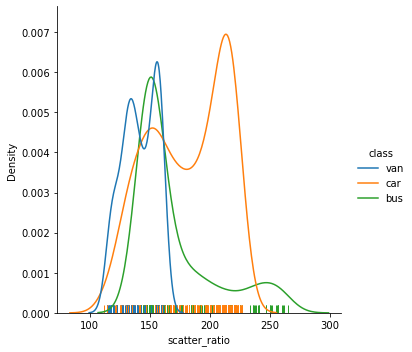

In [31]:
feature = 'scatter_ratio'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()
    

##### <font color=blue>*99% data lies between 69 & 268 .Spread is very high. Quite positively skewed. Has outliers. Contains multiple peaks. Car again has good separation from rest of the two. Bus and Van also looks separable here.*</font>

elongatedness  Mean - Median =  -2.0638
elongatedness  3 Standard Deviation below mean  17.5006
elongatedness  3 Standard Deviation above mean  64.3718


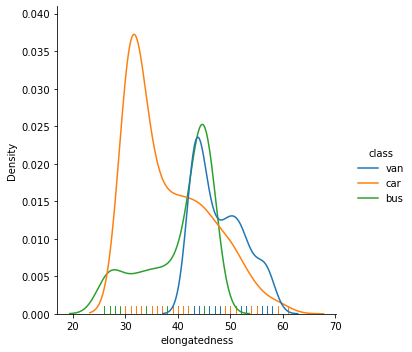

In [32]:
feature = 'elongatedness'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()
    

##### <font color=blue>*99% data lies between 17 & 64. Spread is okay. A bit positively skewed. Has outliers. Contains multiple peaks. Car again has good separation from rest of the two. Bus and Van also looks nicely separable here.*</font>

pr.axis_rectangularity  Mean - Median =  0.5804
pr.axis_rectangularity  3 Standard Deviation below mean  12.8147
pr.axis_rectangularity  3 Standard Deviation above mean  28.3461


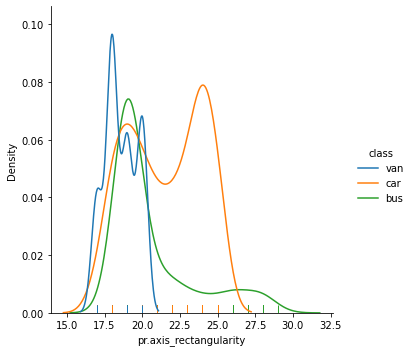

In [33]:
feature = 'pr.axis_rectangularity'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()
    

##### <font color=blue>*99% data lies between 12 & 28. Spread is quite less. Positively skewed. Has outliers. Contains multiple peaks. Car again has good separation from rest of the two. Bus and Van also looks nicely separable here.*</font>

max.length_rectangularity  Mean - Median =  1.9988
max.length_rectangularity  3 Standard Deviation below mean  104.4518
max.length_rectangularity  3 Standard Deviation above mean  191.5458


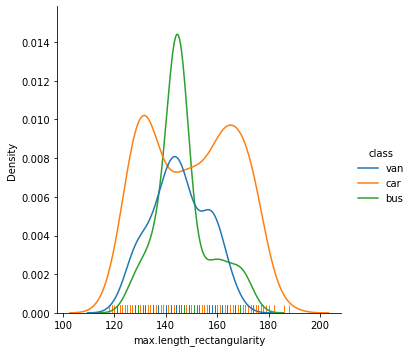

In [34]:
feature = 'max.length_rectangularity'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()
    

##### <font color=blue>*99% data lies between 104 & 191. Spread is high. Contains multiple peaks. Car again has good separation from rest of the two. Bus and Van also looks nicely separable here.*</font>

scaled_variance  Mean - Median =  9.5969
scaled_variance  3 Standard Deviation below mean  94.5156
scaled_variance  3 Standard Deviation above mean  282.6782


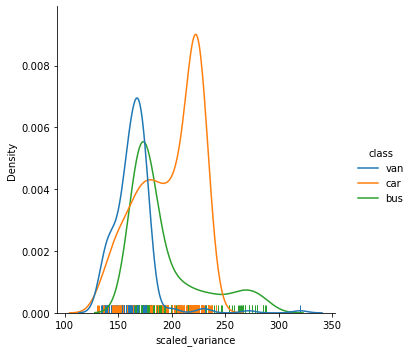

In [35]:
feature = 'scaled_variance'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()    

##### <font color=blue>*99% data lies between 94 & 282. Spread is quite high. Contains multiple peaks. Has outliers. Car again has good separation from rest of the two. Bus and Van also looks somewhat separable here.*</font>

scaled_variance.1  Mean - Median =  75.8144
scaled_variance.1  3 Standard Deviation below mean  -90.1746
scaled_variance.1  3 Standard Deviation above mean  968.8034


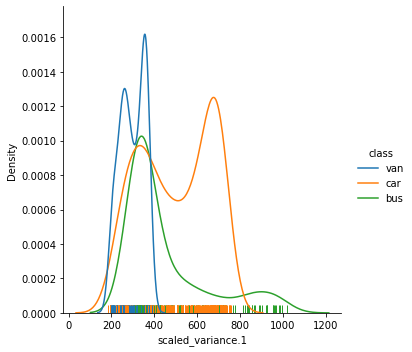

In [36]:
feature = 'scaled_variance.1'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()    

##### <font color=blue>*99% data lies between -90 & 968. Spread is extremely high,highest so far. Contains multiple peaks. Has many outliers. Car again has good separation from rest of the two. Bus and Van also looks somewhat separable here.*</font>

scaled_radius_of_gyration  Mean - Median =  1.2069
scaled_radius_of_gyration  3 Standard Deviation below mean  77.0681
scaled_radius_of_gyration  3 Standard Deviation above mean  272.3457


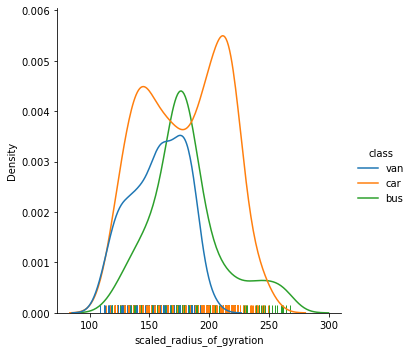

In [37]:
feature = 'scaled_radius_of_gyration'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()    

##### <font color=blue>*99% data lies between 77 & 272. Spread is very high. Contains multiple peaks. Has outliers. Car again has good separation from rest of the two. Bus and Van also looks somewhat separable here.*</font>

scaled_radius_of_gyration.1  Mean - Median =  0.9433
scaled_radius_of_gyration.1  3 Standard Deviation below mean  50.0371
scaled_radius_of_gyration.1  3 Standard Deviation above mean  94.8495


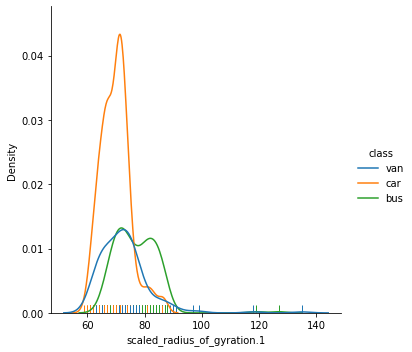

In [38]:
feature = 'scaled_radius_of_gyration.1'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()    

##### <font color=blue>*99% data lies between 50 & 94. Spread is quite less. Contains multiple peaks.Highly positively skewed. Has many outliers. Car again has good separation from rest of the two.*</font>

skewness_about  Mean - Median =  0.3617
skewness_about  3 Standard Deviation below mean  -8.348
skewness_about  3 Standard Deviation above mean  21.0714


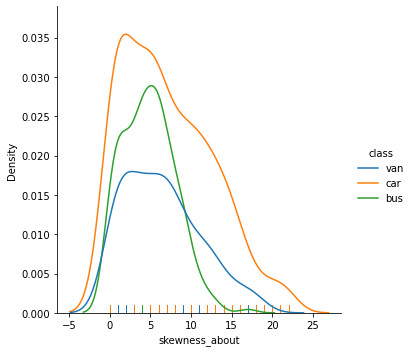

In [39]:
feature = 'skewness_about'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()    

##### <font color=blue>*99% data lies between -8 & 21. Spread is normal. Contains multiple peaks.Positively skewed. Has outliers. No class has good separation here.Classes are overlapping*</font>

skewness_about.1  Mean - Median =  1.6005
skewness_about.1  3 Standard Deviation below mean  -14.1924
skewness_about.1  3 Standard Deviation above mean  39.3934


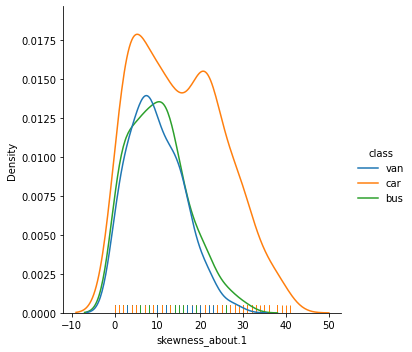

In [40]:
feature = 'skewness_about.1'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()    

##### <font color=blue>*99% data lies between -14 & 39. Spread is normal. Contains multiple peaks.Positively skewed. Has outliers. Again as above no class has good separation here.Classes are overlapping*</font>

skewness_about.2  Mean - Median =  0.9184
skewness_about.2  3 Standard Deviation below mean  170.4617
skewness_about.2  3 Standard Deviation above mean  207.3751


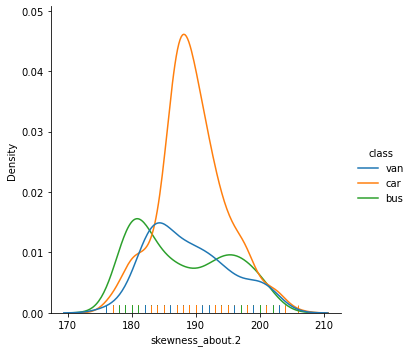

In [41]:
feature = 'skewness_about.2'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()    

##### <font color=blue>*99% data lies between 170 & 207. Spread is high. Contains multiple peaks.Positively skewed. Has outliers.Classes are separable here.*</font>

hollows_ratio  Mean - Median =  -1.3676
hollows_ratio  3 Standard Deviation below mean  173.316
hollows_ratio  3 Standard Deviation above mean  217.9488


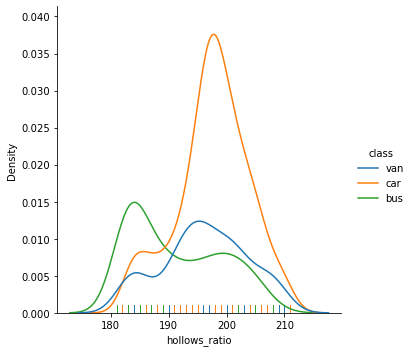

In [42]:
feature = 'hollows_ratio'
mean_minus_median = np.round(new_dataset[feature].mean(),4)  -  np.round((new_dataset[feature].median()),4)
print(feature," Mean - Median = ",np.round(mean_minus_median,4))
minus3std = np.round(new_dataset[feature].mean(),4)  -  np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation below mean ",np.round(minus3std,4))
plus3std = np.round(new_dataset[feature].mean(),4) + np.round((3*new_dataset[feature].std()),4)
print(feature," 3 Standard Deviation above mean ",np.round(plus3std,4))
sns.displot(data=new_dataset, hue='class',x=feature, kind="kde",rug=True)
plt.show()    

##### <font color=blue>*99% data lies between 173 & 217. Spread is normal. Contains multiple peaks.Classes are a bit separable here.*</font>

#### <font color=blue>*Count of each class*</font>

In [43]:
pd.crosstab(new_dataset['class'],columns='count')

col_0,count
class,
bus,218
car,429
van,199


##### <font color=blue>*We may need to balance classes as van has lowest count and car has highest*</font>

#### <font color=blue>*Checking for outliers*</font>

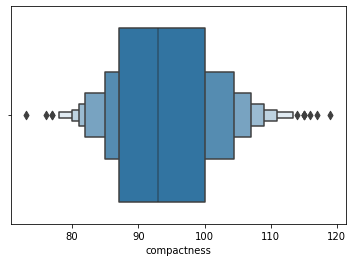

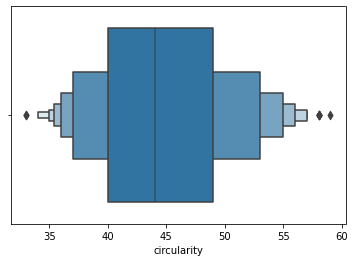

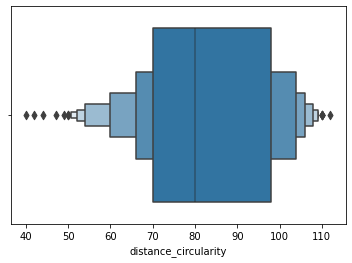

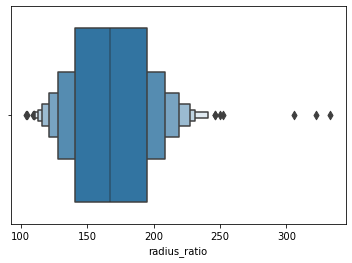

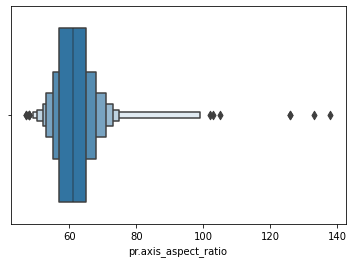

...

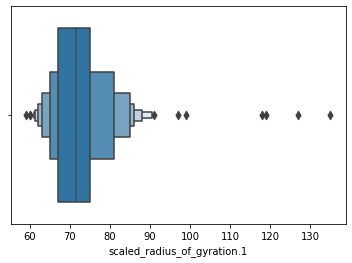

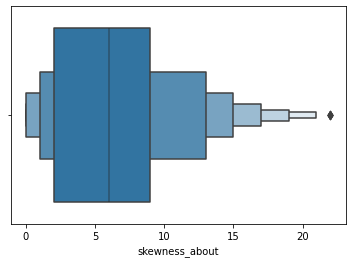

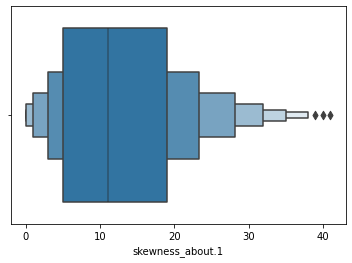

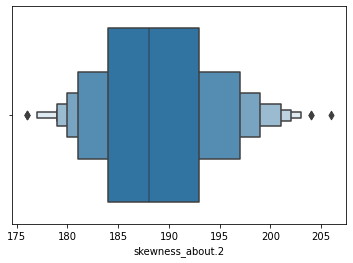

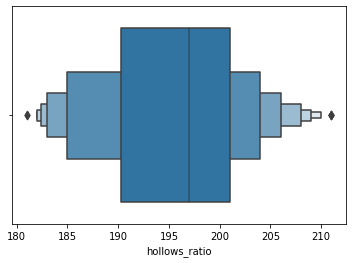

In [44]:
for feature in new_dataset.columns:
    if(feature not in ['class']):
        sns.boxenplot(x=feature,data=new_dataset,hue='class')
        plt.show()

##### <font color=blue>*Many of them have outliers. We might need to work on this before we do modelling.*</font>
##### <font color=blue>There is one more issue here. I don't know whether the outliers are valid or not. If outliers are invalid then we can drop it. But here I don't know their validness so here considering all of them as valid.</font>

##### <font color=blue>*Outlier treatment would be done later, if required*</font>

### <font color=red>Bivariate/Multivariate Analysis</font>

#### <font color=blue>*Bar Plots Analysis*</font>

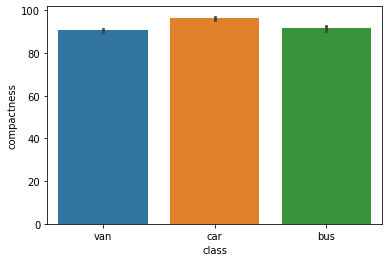

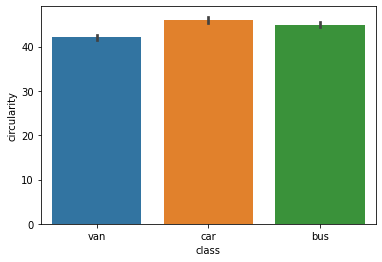

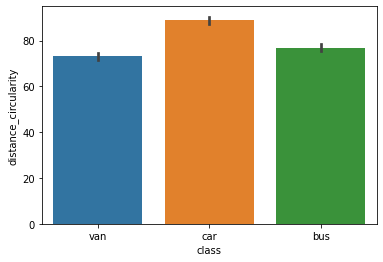

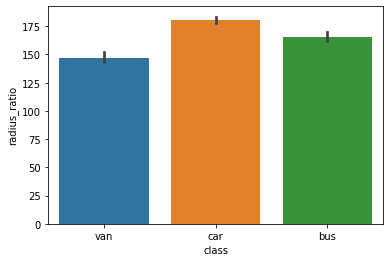

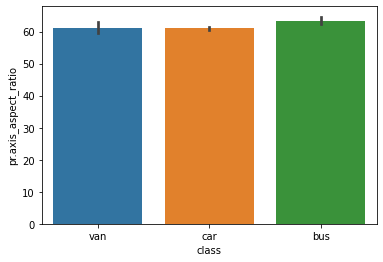

...

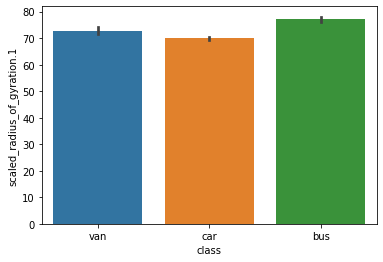

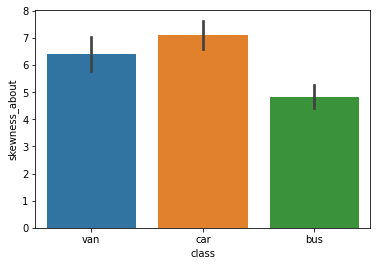

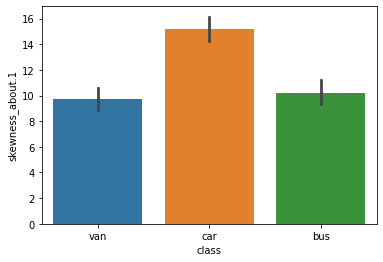

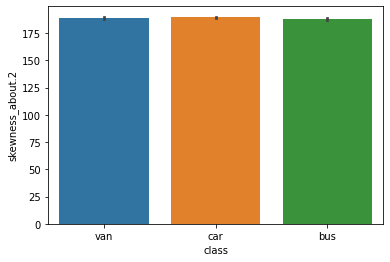

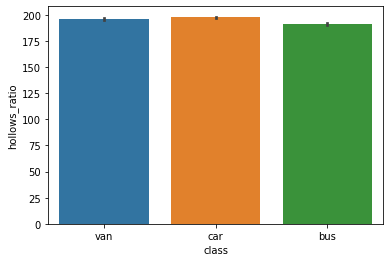

In [45]:
for feature in new_dataset.columns:
    if(feature not in ['class']):
        sns.barplot(x='class',y=feature,data=new_dataset)
        plt.show()
    

##### <font color=blue>*It is observed that features 'distance_circularity','radius_ratio','max.length_aspect_ratio', 'scatter_ratio','elongatedness', 'pr.axis_rectangularity','scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration','skewness_about', 'skewness_about.1' has noticeable differences among the the 3 classes.*</font>

#### <font color=blue>*Correlation HeatMap Analysis*</font>

##### <font color=blue>*Mapping class values with integers so that it will be visible in heatmap*</font>

In [46]:
new_dataset['class'] = new_dataset['class'].map({'car':0,'van':1,'bus':2})

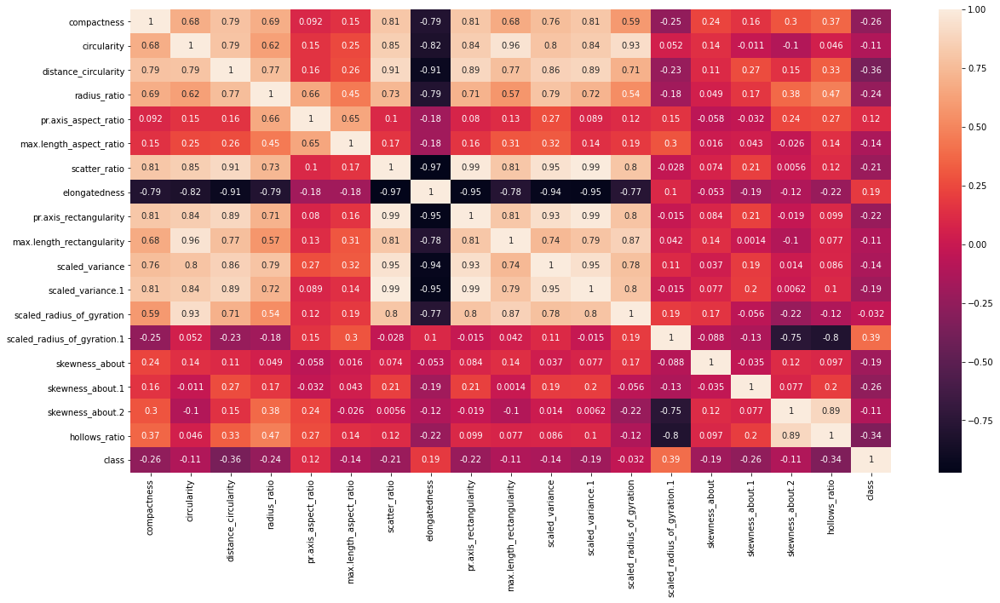

In [47]:
plt.figure(figsize=(20,10))
sns.heatmap(data=new_dataset.corr(),annot=True)
plt.show()

##### <font color=blue>*Many features have good relation with the target ,'class' variable. Lot of multicollinearity is also visible.*</font>

#### <font color=blue>*Pairplot Analysis*</font>

In [48]:
sns.set(font_scale=3)
sns.pairplot(data=new_dataset,hue='class',diag_kind='kde', palette='Dark2',corner=True,height=7)
plt.show() 

##### <font color=blue>*Looking at diagonal plots,almost all of the features have good separation except,'max.length_aspect_ratio', 'pr.axis_aspect_ratio','scaled_radius_of_gyration.1' *</font>
##### <font color=blue>*Lot of multicollinearity is also observed. Same we had observed in heatmap also.*</font>

##### <font color=blue>*So far,all features except 'max.length_aspect_ratio', 'pr.axis_aspect_ratio','scaled_radius_of_gyration.1' looks good for analysis.*</font>

##### <font color=blue>*Now using Select K Best*</font>

In [49]:
X=new_dataset.iloc[:,:-1]
y=new_dataset.iloc[:,-1:]

In [50]:
X.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,95.0,48.0,83.0,178.0,72.0,10.0,162.0,42.0,20.0,159.0,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197.0
1,91.0,41.0,84.0,141.0,57.0,9.0,149.0,45.0,19.0,143.0,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199.0
2,104.0,50.0,106.0,209.0,66.0,10.0,207.0,32.0,23.0,158.0,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196.0
3,93.0,41.0,82.0,159.0,63.0,9.0,144.0,46.0,19.0,143.0,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207.0
4,85.0,44.0,70.0,205.0,103.0,52.0,149.0,45.0,19.0,144.0,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183.0


In [51]:
y.head()

,class
0,1
1,1
2,0
3,1
4,2


In [52]:
select_k_best = feature_selection.SelectKBest(score_func=feature_selection.f_classif,k=12)
best_features = select_k_best.fit_transform(X,y)

In [53]:
supportList = select_k_best.get_support().tolist()
p_valuesList = select_k_best.pvalues_.tolist()

In [54]:
rejected_features=[]

for i in np.arange(len(X.columns)):
    bool = supportList[i]
    if(bool == False):
        rejected_features.append(X.columns[i])        

In [55]:
rejected_features

['circularity',
 'pr.axis_aspect_ratio',
 'max.length_aspect_ratio',
 'max.length_rectangularity',
 'skewness_about',
 'skewness_about.2']

##### <font color=blue>Creating a dataframe with  the best features and their corresponding p values</font>

In [56]:
x_p_values = pd.DataFrame() 
x_p_values["feature"] = X.columns 
x_p_values["P Values"] = [p_valuesList[i] for i in range(len(X.columns))] 
x_p_values.sort_values(by='P Values')

,feature,P Values
7,elongatedness,1.482103e-55
6,scatter_ratio,5.026676e-48
11,scaled_variance.1,3.860165e-44
8,pr.axis_rectangularity,7.969632e-43
2,distance_circularity,6.291070e-41
10,scaled_variance,5.526695e-40
3,radius_ratio,3.943006e-33
13,scaled_radius_of_gyration.1,6.185168e-32
17,hollows_ratio,1.201370e-24
0,compactness,1.833529e-19


##### <font color=blue>*Dropping above mentioned rejected features*</font>

In [57]:
X.drop(rejected_features,axis=1,inplace=True)

In [58]:
X.head()

,compactness,distance_circularity,radius_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about.1,hollows_ratio
0,95.0,83.0,178.0,162.0,42.0,20.0,176.0,379.0,184.0,70.0,16.0,197.0
1,91.0,84.0,141.0,149.0,45.0,19.0,170.0,330.0,158.0,72.0,14.0,199.0
2,104.0,106.0,209.0,207.0,32.0,23.0,223.0,635.0,220.0,73.0,9.0,196.0
3,93.0,82.0,159.0,144.0,46.0,19.0,160.0,309.0,127.0,63.0,10.0,207.0
4,85.0,70.0,205.0,149.0,45.0,19.0,241.0,325.0,188.0,127.0,11.0,183.0


##### <font color=blue>*Selected above features based on their p-values*</font>

## <font color=blue>3. Split the data into train and test</font>

In [59]:
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,shuffle=True,test_size=0.2,random_state=1)

## <font color=blue>4. Train a Support vector machine using the train set and get the accuracy on the test set</font>

##### <font color=blue>*As SVM is distance based algorithm, first scaling and transforming the data.*</font>

In [60]:
power = preprocessing.PowerTransformer(method='yeo-johnson', standardize=True)
df_transformed = power.fit_transform(X_train)
X_train_transformed = pd.DataFrame(df_transformed, columns = X_train.columns)

df_transformed_test = power.fit_transform(X_test)
X_test_transformed = pd.DataFrame(df_transformed_test, columns = X_test.columns)

##### <font color=blue>*Kernel - Linear*</font>

In [61]:
svc_linear = svm.SVC(C=50,kernel='linear', gamma= 1)

In [62]:
svc_linear.fit(X_train_transformed,y_train)

SVC(C=50, gamma=1, kernel='linear')

In [63]:
svc_predictions = svc_linear.predict(X_test_transformed)

##### <font color=blue>*Check the accuracy*</font>

In [64]:
print(svc_linear.score(X_train_transformed, y_train))
print(svc_linear.score(X_test_transformed, y_test))

0.8875739644970414
0.8705882352941177


##### <font color=blue>*Kernel - RBF*</font>

In [65]:
svc_rbf = svm.SVC(C=3,kernel='rbf', gamma= 1)

In [66]:
svc_rbf.fit(X_train_transformed,y_train)

SVC(C=3, gamma=1)

In [67]:
svc_predictions = svc_rbf.predict(X_test_transformed)

##### <font color=blue>*Check the accuracy*</font>

In [68]:
print(svc_rbf.score(X_train_transformed, y_train))
print(svc_rbf.score(X_test_transformed, y_test))

0.9985207100591716
0.8823529411764706


##### <font color=blue>*Kernel - Poly*</font>

In [69]:
svc_poly = svm.SVC(C=3,kernel='poly', gamma= 1)

In [70]:
svc_poly.fit(X_train_transformed,y_train)

SVC(C=3, gamma=1, kernel='poly')

In [71]:
svc_predictions = svc_poly.predict(X_test_transformed)

##### <font color=blue>*Check the accuracy*</font>

In [72]:
print(svc_poly.score(X_train_transformed, y_train))
print(svc_poly.score(X_test_transformed, y_test))

0.9985207100591716
0.9


## <font color=blue>5. Use PCA from Scikit learn, extract Principal Components that capture about 95% of the variance in the data</font>

In [73]:
pca = decomposition.PCA(n_components=6)
pca_X_train = pca.fit_transform(X_train_transformed)
pca_X_test = pca.transform(X_test_transformed)

In [74]:
print("pca.explained_variance_")
print(pca.explained_variance_)

pca.explained_variance_
[7.81508724 2.17999864 0.9767679  0.32441217 0.27585743 0.21570043]


In [75]:
print("Explained Variance Ratio")
print()
ar=pca.explained_variance_ratio_
ar=-np.sort(-ar)
total=0

for i in np.arange(0,len(ar)):
    print(ar[i])
    total = total + ar[i]
print()
print('Explained Variance Ratio Total=',total)

Explained Variance Ratio

0.6502938714865886
0.1813978157485291
0.08127691486054162
0.026994355639806764
0.022954112812583333
0.01794844591716244

Explained Variance Ratio Total= 0.9808655164652119


##### <font color=blue>*So top 6 components are capturing 98% of variance*</font>

## <font color=blue>6. Train a Support vector machine using the Principal Components and get the accuracy on the test set</font>

##### <font color=blue>*Kernel - Linear*</font>

In [76]:
svc_linear = svm.SVC(C=50,kernel='linear', gamma= 1)

In [77]:
svc_linear.fit(pca_X_train,y_train)

SVC(C=50, gamma=1, kernel='linear')

In [78]:
svc_predictions = svc_linear.predict(pca_X_test)

##### <font color=blue>*Check the accuracy*</font>

In [79]:
print(svc_linear.score(pca_X_train, y_train))
print(svc_linear.score(pca_X_test, y_test))

0.7115384615384616
0.6882352941176471


##### <font color=blue>*Kernel - RBF*</font>

In [80]:
svc_rbf = svm.SVC(C=3,kernel='rbf', gamma= 1)

In [81]:
svc_rbf.fit(pca_X_train,y_train)

SVC(C=3, gamma=1)

In [82]:
svc_predictions = svc_rbf.predict(pca_X_test)

##### <font color=blue>*Check the accuracy*</font>

In [83]:
print(svc_rbf.score(pca_X_train, y_train))
print(svc_rbf.score(pca_X_test, y_test))

0.992603550295858
0.8705882352941177


##### <font color=blue>*Kernel - Poly*</font>

In [84]:
svc_poly = svm.SVC(C=3,kernel='poly', gamma= 1)

In [85]:
svc_poly.fit(pca_X_train,y_train)

SVC(C=3, gamma=1, kernel='poly')

In [86]:
svc_predictions = svc_poly.predict(pca_X_test)

##### <font color=blue>*Check the accuracy*</font>

In [87]:
print(svc_poly.score(pca_X_train, y_train))
print(svc_poly.score(pca_X_test, y_test))

0.8698224852071006
0.788235294117647


## <font color=blue>7. Compare the accuracy scores of Support vector machines – one trained using raw data and the other using Principal Components, and mention your findings</font>

In [88]:
new_dataset.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95.0,48.0,83.0,178.0,72.0,10.0,162.0,42.0,20.0,159.0,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197.0,1
1,91.0,41.0,84.0,141.0,57.0,9.0,149.0,45.0,19.0,143.0,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199.0,1
2,104.0,50.0,106.0,209.0,66.0,10.0,207.0,32.0,23.0,158.0,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196.0,0
3,93.0,41.0,82.0,159.0,63.0,9.0,144.0,46.0,19.0,143.0,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207.0,1
4,85.0,44.0,70.0,205.0,103.0,52.0,149.0,45.0,19.0,144.0,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183.0,2


### <font color=blue>*Taking all features into consideration*</font>

In [89]:
X=new_dataset.iloc[:,:-1]
y=new_dataset.iloc[:,-1:]

In [90]:
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,shuffle=True,test_size=0.2,random_state=1)

In [91]:
print("Data: Raw","Kernel: Linear")
svc_linear = svm.SVC(C=50,kernel='linear', gamma= 1)
svc_linear.fit(X_train,y_train)
svc_predictions = svc_linear.predict(X_test)
print("Train Score",svc_linear.score(X_train, y_train))
print("Test Score",svc_linear.score(X_test, y_test))
print("--------------------------------")
print()
print("Data: Raw","Kernel: RBF")
svc_rbf = svm.SVC(C=3,kernel='rbf', gamma= 1)
svc_rbf.fit(X_train,y_train)
svc_predictions = svc_rbf.predict(X_test)
print("Train Score",svc_rbf.score(X_train, y_train))
print("Test Score",svc_rbf.score(X_test, y_test))
print("--------------------------------")
print()
print("Data: Raw","Kernel: Poly")
svc_poly = svm.SVC(C=3,kernel='poly', gamma= 1)
svc_poly.fit(X_train,y_train)
svc_predictions = svc_poly.predict(X_test)
print("Train Score",svc_poly.score(X_train, y_train))
print("Test Score",svc_poly.score(X_test, y_test))
print("--------------------------------")
print()

print("Confusion Matrix & For Kernel Poly")
conf_matrix  = metrics.confusion_matrix(y_test,svc_predictions)
class_report = metrics.classification_report(y_test,svc_predictions)
print(conf_matrix)
print()
print("Classification Report For Kernel Poly")
print(class_report)

Data: Raw Kernel: Linear
Train Score 0.9866863905325444
Test Score 0.9705882352941176
--------------------------------

Data: Raw Kernel: RBF
Train Score 1.0
Test Score 0.5294117647058824
--------------------------------

Data: Raw Kernel: Poly
Train Score 1.0
Test Score 0.9882352941176471
--------------------------------

Confusion Matrix & For Kernel Poly
[[90  0  0]
 [ 1 42  0]
 [ 1  0 36]]

Classification Report For Kernel Poly
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        90
           1       1.00      0.98      0.99        43
           2       1.00      0.97      0.99        37

    accuracy                           0.99       170
   macro avg       0.99      0.98      0.99       170
weighted avg       0.99      0.99      0.99       170



##### <font color=blue>*Scaling and transforming data*</font>

In [92]:
power = preprocessing.PowerTransformer(method='yeo-johnson', standardize=True)
df_transformed = power.fit_transform(X_train)
X_train_transformed = pd.DataFrame(df_transformed, columns = X_train.columns)

df_transformed_test = power.fit_transform(X_test)
X_test_transformed = pd.DataFrame(df_transformed_test, columns = X_test.columns)

In [93]:
print("Data: Scaled & Transformed","Kernel: Linear")
svc_linear = svm.SVC(C=50,kernel='linear', gamma= 1)
svc_linear.fit(X_train_transformed,y_train)
svc_predictions = svc_linear.predict(X_test_transformed)
print("Train Score",svc_linear.score(X_train_transformed, y_train))
print("Test Score",svc_linear.score(X_test_transformed, y_test))
print("--------------------------------")
print()
print("Data: Scaled & Transformed","Kernel: RBF")
svc_rbf = svm.SVC(C=3,kernel='rbf', gamma= 1)
svc_rbf.fit(X_train_transformed,y_train)
svc_predictions = svc_rbf.predict(X_test_transformed)
print("Train Score",svc_rbf.score(X_train_transformed, y_train))
print("Test Score",svc_rbf.score(X_test_transformed, y_test))
print("--------------------------------")
print()
print("Data: Scaled & Transformed","Kernel: Poly")
svc_poly = svm.SVC(C=3,kernel='poly', gamma= 1)
svc_poly.fit(X_train_transformed,y_train)
svc_predictions = svc_poly.predict(X_test_transformed)
print("Train Score",svc_poly.score(X_train_transformed, y_train))
print("Test Score",svc_poly.score(X_test_transformed, y_test))
print("--------------------------------")
print()

print("Confusion Matrix & For Kernel Poly")
conf_matrix  = metrics.confusion_matrix(y_test,svc_predictions)
class_report = metrics.classification_report(y_test,svc_predictions)
print(conf_matrix)
print()
print("Classification Report For Kernel Poly")
print(class_report)

Data: Scaled & Transformed Kernel: Linear
Train Score 0.9526627218934911
Test Score 0.9294117647058824
--------------------------------

Data: Scaled & Transformed Kernel: RBF
Train Score 1.0
Test Score 0.8176470588235294
--------------------------------

Data: Scaled & Transformed Kernel: Poly
Train Score 1.0
Test Score 0.9647058823529412
--------------------------------

Confusion Matrix & For Kernel Poly
[[86  3  1]
 [ 1 42  0]
 [ 0  1 36]]

Classification Report For Kernel Poly
              precision    recall  f1-score   support

           0       0.99      0.96      0.97        90
           1       0.91      0.98      0.94        43
           2       0.97      0.97      0.97        37

    accuracy                           0.96       170
   macro avg       0.96      0.97      0.96       170
weighted avg       0.97      0.96      0.96       170



##### <font color=blue>*Now applying PCA on scaled and transformed data*</font>

In [94]:
pca = decomposition.PCA(n_components=8)
pca_X_train = pca.fit_transform(X_train_transformed)
pca_X_test = pca.transform(X_test_transformed)
print("pca.explained_variance_")
print(pca.explained_variance_)

pca.explained_variance_
[9.6263317  3.31526305 1.2078995  1.17605685 0.84743824 0.77510979
 0.37098052 0.26443483]


In [95]:
print("Explained Variance Ratio")
print()
ar=pca.explained_variance_ratio_
ar=-np.sort(-ar)
total=0

for i in np.arange(0,len(ar)):
    print(ar[i])
    total = total + ar[i]
print()
print('Explained Variance Ratio Total=',total)

Explained Variance Ratio

0.5340050870431853
0.1839088230186953
0.06700625940520745
0.0652398399203259
0.04701025712647679
0.04299795420499593
0.020579540714545354
0.014669091924385253

Explained Variance Ratio Total= 0.9754168533578172


In [96]:
print("Data: Scaled & Transformed & PCA","Kernel: Linear")
svc_linear = svm.SVC(C=50,kernel='linear', gamma= 1)
svc_linear.fit(pca_X_train,y_train)
svc_predictions = svc_linear.predict(pca_X_test)
print("Train Score",svc_linear.score(pca_X_train, y_train))
print("Test Score",svc_linear.score(pca_X_test, y_test))
print("--------------------------------")
print()
print("Data: Scaled & Transformed & PCA","Kernel: RBF")
svc_rbf = svm.SVC(C=3,kernel='rbf', gamma= 1)
svc_rbf.fit(pca_X_train,y_train)
svc_predictions = svc_rbf.predict(pca_X_test)
print("Train Score",svc_rbf.score(pca_X_train, y_train))
print("Test Score",svc_rbf.score(pca_X_test, y_test))
print("--------------------------------")
print()
print("Data: Scaled & Transformed & PCA","Kernel: Poly")
svc_poly = svm.SVC(C=3,kernel='poly', gamma= 1)
svc_poly.fit(pca_X_train,y_train)
svc_predictions = svc_poly.predict(pca_X_test)
print("Train Score",svc_poly.score(pca_X_train, y_train))
print("Test Score",svc_poly.score(pca_X_test, y_test))
print("--------------------------------")
print()

print("Confusion Matrix & For Kernel Poly")
conf_matrix  = metrics.confusion_matrix(y_test,svc_predictions)
class_report = metrics.classification_report(y_test,svc_predictions)
print(conf_matrix)
print()
print("Classification Report For Kernel Poly")
print(class_report)

Data: Scaled & Transformed & PCA Kernel: Linear
Train Score 0.863905325443787
Test Score 0.8764705882352941
--------------------------------

Data: Scaled & Transformed & PCA Kernel: RBF
Train Score 1.0
Test Score 0.8529411764705882
--------------------------------

Data: Scaled & Transformed & PCA Kernel: Poly
Train Score 0.9985207100591716
Test Score 0.9
--------------------------------

Confusion Matrix & For Kernel Poly
[[80  5  5]
 [ 4 38  1]
 [ 2  0 35]]

Classification Report For Kernel Poly
              precision    recall  f1-score   support

           0       0.93      0.89      0.91        90
           1       0.88      0.88      0.88        43
           2       0.85      0.95      0.90        37

    accuracy                           0.90       170
   macro avg       0.89      0.91      0.90       170
weighted avg       0.90      0.90      0.90       170



### <font color=blue>*Results are quite confusing. Raw data gave the best accuracy,98%. Transformed data gave 96% and PCA gave 90%*</font>
### <font color=blue>*So, for this dataset, if SVC is to be used, then Poly kerner proved best. It is better to use it on raw data*</font>

## <font color=blue>8. Optional task : clustering</font>

### <font color=blue>*8a. Apply Kmeans clustering on the principal components train data. Get the cluster labels and append to the same data as a column.Similarly, use the ‘predict’ function of Kmeans clustering to get the clusters on the PC test data and append the cluster labels*</font>

#### <font color=blue>*Using Raw Data*</font>

    num_clusters  cluster_errors
0              1    3.074099e+07
1              2    7.310381e+06
2              3    4.908076e+06
3              4    3.577516e+06
4              5    2.388949e+06
5              6    1.916127e+06
6              7    1.681702e+06
7              8    1.521381e+06
8              9    1.382377e+06
9             10    1.280326e+06
10            11    1.185735e+06
11            12    1.094829e+06
12            13    1.034070e+06
13            14    9.595244e+05
14            15    9.246878e+05


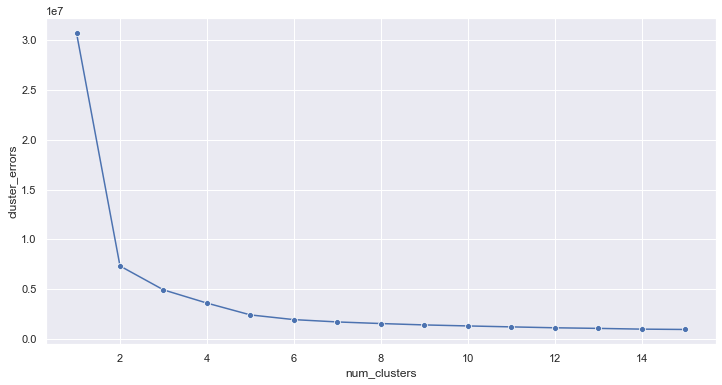

Wall time: 3.74 s


In [97]:
%%time


clusters = range(1,16)
labels_list = []
centeroids_list = []
cluster_errors_list = []

for num in clusters:
    k_means = cluster.KMeans(n_clusters=num,n_init=10,random_state=1)
    k_means.fit(new_dataset)
    k_means_predictions=k_means.predict(new_dataset)
    labels = k_means.labels_
    centeroids = k_means.cluster_centers_
    errors = k_means.inertia_
    labels_list.append(labels)
    centeroids_list.append(centeroids)
    cluster_errors_list.append(errors)

cluster_df = pd.DataFrame({ "num_clusters":clusters, "cluster_errors": cluster_errors_list} )
print(cluster_df)

# Elbow plot

sns.set(font_scale=1)
plt.figure(figsize=(12,6))
sns.lineplot(x=cluster_df.num_clusters, y=cluster_df.cluster_errors, marker="o")
plt.show()

### <font color=blue>*Going ahead with 3 clusters*</font>

In [98]:
k_means = cluster.KMeans(n_clusters=3,n_init=10,random_state=1)
k_means.fit(new_dataset)
k_means_predictions=k_means.predict(new_dataset)

In [99]:
new_dataset['cluster'] = k_means_predictions

In [100]:
new_dataset.head(5)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class,cluster
0,95.0,48.0,83.0,178.0,72.0,10.0,162.0,42.0,20.0,159.0,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197.0,1,2
1,91.0,41.0,84.0,141.0,57.0,9.0,149.0,45.0,19.0,143.0,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199.0,1,2
2,104.0,50.0,106.0,209.0,66.0,10.0,207.0,32.0,23.0,158.0,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196.0,0,1
3,93.0,41.0,82.0,159.0,63.0,9.0,144.0,46.0,19.0,143.0,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207.0,1,2
4,85.0,44.0,70.0,205.0,103.0,52.0,149.0,45.0,19.0,144.0,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183.0,2,2


In [101]:
cluster_group = new_dataset.groupby('cluster')
cluster_group.count()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
cluster,,,,,,,,,,,,,,,,,,,
0,150,150,150,150,150,150,150,150,150,150,150,150,150,150,150,150,150,150,150
1,210,210,210,210,210,210,210,210,210,210,210,210,210,210,210,210,210,210,210
2,486,486,486,486,486,486,486,486,486,486,486,486,486,486,486,486,486,486,486


### <font color=blue>*8b. using this new train and test data (the only difference is that there is a new column with cluster labels), train and evaluate an SVM model*</font>

In [102]:
cluster_0_dataset = new_dataset[new_dataset['cluster']==0]
cluster_1_dataset = new_dataset[new_dataset['cluster']==1]
cluster_2_dataset = new_dataset[new_dataset['cluster']==2] 

In [103]:
cluster_0_dataset.drop(['cluster'],axis=1,inplace=True)
cluster_1_dataset.drop(['cluster'],axis=1,inplace=True)
cluster_2_dataset.drop(['cluster'],axis=1,inplace=True)

In [104]:
print(cluster_0_dataset.shape)
print(cluster_1_dataset.shape)
print(cluster_2_dataset.shape)


(150, 19)
(210, 19)
(486, 19)


In [105]:
%%time

X = cluster_0_dataset.iloc[:,:-1]
y= cluster_0_dataset.iloc[:,-1:]

X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size=0.2,shuffle=True ,random_state=1)

print("Cluster 0 Without Scaling & PCA")
print("--------------------------------")
print("--------------------------------")
print()
print("Data: Raw","Kernel: Linear")
svc_linear = svm.SVC(C=50,kernel='linear', gamma= 1)
svc_linear.fit(X_train,y_train)
svc_predictions = svc_linear.predict(X_test)
print("Train Score",svc_linear.score(X_train, y_train))
print("Test Score",svc_linear.score(X_test, y_test))
print("--------------------------------")
print()
print("Data: Raw","Kernel: RBF")
svc_rbf = svm.SVC(C=3,kernel='rbf', gamma= 1)
svc_rbf.fit(X_train,y_train)
svc_predictions = svc_rbf.predict(X_test)
print("Train Score",svc_rbf.score(X_train, y_train))
print("Test Score",svc_rbf.score(X_test, y_test))
print("--------------------------------")
print()
print("Data: Raw","Kernel: Poly")
svc_poly = svm.SVC(C=3,kernel='poly', gamma= 1)
svc_poly.fit(X_train,y_train)
svc_predictions = svc_poly.predict(X_test)
print("Train Score",svc_poly.score(X_train, y_train))
print("Test Score",svc_poly.score(X_test, y_test))
print("--------------------------------")
print()

print("Confusion Matrix & For Kernel Poly")
conf_matrix  = metrics.confusion_matrix(y_test,svc_predictions)
class_report = metrics.classification_report(y_test,svc_predictions)
print(conf_matrix)
print()
print("Classification Report For Kernel Poly")
print(class_report)

Cluster 0 Without Scaling & PCA
--------------------------------
--------------------------------

Data: Raw Kernel: Linear
Train Score 1.0
Test Score 1.0
--------------------------------

Data: Raw Kernel: RBF
Train Score 1.0
Test Score 0.6333333333333333
--------------------------------

Data: Raw Kernel: Poly
Train Score 1.0
Test Score 1.0
--------------------------------

Confusion Matrix & For Kernel Poly
[[19  0  0]
 [ 0  1  0]
 [ 0  0 10]]

Classification Report For Kernel Poly
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        19
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00        10

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30

Wall time: 79.4 ms


In [106]:
%%time

X = cluster_0_dataset.iloc[:,:-1]
y= cluster_0_dataset.iloc[:,-1:]

X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size=0.2,shuffle=True ,random_state=1)

print("Cluster 0 With Scaling & PCA")
print("--------------------------------")
print("--------------------------------")
print()

power = preprocessing.PowerTransformer(method='yeo-johnson', standardize=True)
df_transformed = power.fit_transform(X_train)
X_train_transformed = pd.DataFrame(df_transformed, columns = X_train.columns)

df_transformed_test = power.fit_transform(X_test)
X_test_transformed = pd.DataFrame(df_transformed_test, columns = X_test.columns)

pca = decomposition.PCA(n_components=7)
# n_components=10
pca_X_train = pca.fit_transform(X_train_transformed)
pca_X_test = pca.transform(X_test_transformed)

print("PCA Explained Variance")
print(pca.explained_variance_)

print("Explained Variance Ratio")
ar=pca.explained_variance_ratio_
ar.sort()
total=0

for i in np.arange(0,len(ar)):
    print(ar[i])
    total = total + ar[i]

print('Explained Variance Ratio Total=',total)
print()
print("Data: Raw","Kernel: Linear")
svc_linear = svm.SVC(C=50,kernel='linear', gamma= 1)
svc_linear.fit(pca_X_train,y_train)
svc_predictions = svc_linear.predict(pca_X_test)
print("Train Score",svc_linear.score(pca_X_train, y_train))
print("Test Score",svc_linear.score(pca_X_test, y_test))
print("--------------------------------")
print()
print("Data: Raw","Kernel: RBF")
svc_rbf = svm.SVC(C=3,kernel='rbf', gamma= 1)
svc_rbf.fit(pca_X_train,y_train)
svc_predictions = svc_rbf.predict(pca_X_test)
print("Train Score",svc_rbf.score(pca_X_train, y_train))
print("Test Score",svc_rbf.score(pca_X_test, y_test))
print("--------------------------------")
print()
print("Data: Raw","Kernel: Poly")
svc_poly = svm.SVC(C=0.01,kernel='poly', gamma=1)
svc_poly.fit(pca_X_train,y_train)
svc_predictions = svc_poly.predict(pca_X_test)
print("Train Score",svc_poly.score(pca_X_train, y_train))
print("Test Score",svc_poly.score(pca_X_test, y_test))
print("--------------------------------")
print()

print("Confusion Matrix & For Kerner Poly")
conf_matrix  = metrics.confusion_matrix(y_test,svc_predictions)
class_report = metrics.classification_report(y_test,svc_predictions)
print(conf_matrix)
print()
print("Classification Report For Kerner Poly")
print(class_report)


Cluster 0 With Scaling & PCA
--------------------------------
--------------------------------

PCA Explained Variance
[6.8843143  2.42239701 2.24190242 1.8033762  1.17949286 0.82527261
 0.58800313]
Explained Variance Ratio
0.03430018272818968
0.04814090249558957
0.0688037500610616
0.10519694472416102
0.1307776413844741
0.14130649210259358
0.4015850009798375
Explained Variance Ratio Total= 0.9301109144759071

Data: Raw Kernel: Linear
Train Score 1.0
Test Score 0.9666666666666667
--------------------------------

Data: Raw Kernel: RBF
Train Score 1.0
Test Score 0.6666666666666666
--------------------------------

Data: Raw Kernel: Poly
Train Score 1.0
Test Score 0.9
--------------------------------

Confusion Matrix & For Kerner Poly
[[19  0  0]
 [ 1  0  0]
 [ 2  0  8]]

Classification Report For Kerner Poly
              precision    recall  f1-score   support

           0       0.86      1.00      0.93        19
           1       0.00      0.00      0.00         1
           2      

### <font color=blue>*c. Write down your comments on the outcome. Whether there is an improvement in the metrics or not, after using the cluster information in our data*</font>

### <font color=blue>Clusteing improved test score for sure but again raw data outshines scaled data and pca for reasons I don't understand right now.</font>

## <font color=blue>*Finally trying with balanced raw data*</font>

In [107]:
from imblearn.over_sampling import SMOTE

In [108]:
X=new_dataset.iloc[:,:-1]
y=new_dataset.iloc[:,-1:]

In [109]:
smote = SMOTE(random_state=7,k_neighbors=11,sampling_strategy='minority')
Balanced_X,Balanced_y = smote.fit_sample(X,y)
before = pd.merge(X,y,right_index=True, left_index=True)
after = pd.merge(Balanced_X,Balanced_y,right_index=True, left_index=True)
b=before['class'].value_counts()
a=after['class'].value_counts()
print('Before')
print(b)
print('After')
print(a)

Before
0    429
2    218
1    199
Name: class, dtype: int64
After
0    688
1    250
2    244
Name: class, dtype: int64


In [110]:
X_train,X_test,y_train,y_test = model_selection.train_test_split(Balanced_X,Balanced_y,shuffle=True,test_size=0.2,random_state=1)

In [111]:
print("Data: Raw","Kernel: Linear")
svc_linear = svm.SVC(C=50,kernel='linear', gamma= 1)
svc_linear.fit(X_train,y_train)
svc_predictions = svc_linear.predict(X_test)
print("Train Score",svc_linear.score(X_train, y_train))
print("Test Score",svc_linear.score(X_test, y_test))
print("--------------------------------")
print()
print("Data: Raw","Kernel: RBF")
svc_rbf = svm.SVC(C=3,kernel='rbf', gamma= 1)
svc_rbf.fit(X_train,y_train)
svc_predictions = svc_rbf.predict(X_test)
print("Train Score",svc_rbf.score(X_train, y_train))
print("Test Score",svc_rbf.score(X_test, y_test))
print("--------------------------------")
print()
print("Data: Raw","Kernel: Poly")
svc_poly = svm.SVC(C=3,kernel='poly', gamma= 1)
svc_poly.fit(X_train,y_train)
svc_predictions = svc_poly.predict(X_test)
print("Train Score",svc_poly.score(X_train, y_train))
print("Test Score",svc_poly.score(X_test, y_test))
print("--------------------------------")
print()

print("Confusion Matrix & For Kernel Poly")
conf_matrix  = metrics.confusion_matrix(y_test,svc_predictions)
class_report = metrics.classification_report(y_test,svc_predictions)
print(conf_matrix)
print()
print("Classification Report For Kernel Poly")
print(class_report)

Data: Raw Kernel: Linear
Train Score 1.0
Test Score 1.0
--------------------------------

Data: Raw Kernel: RBF
Train Score 1.0
Test Score 0.4177215189873418
--------------------------------

Data: Raw Kernel: Poly
Train Score 1.0
Test Score 1.0
--------------------------------

Confusion Matrix & For Kernel Poly
[[101   0   0]
 [  0  50   0]
 [  0   0  86]]

Classification Report For Kernel Poly
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       101
           1       1.00      1.00      1.00        50
           2       1.00      1.00      1.00        86

    accuracy                           1.00       237
   macro avg       1.00      1.00      1.00       237
weighted avg       1.00      1.00      1.00       237



##### <font color=blue>*Balanced Scaled Data*</font>

In [112]:
power = preprocessing.PowerTransformer(method='yeo-johnson', standardize=True)
df_transformed = power.fit_transform(X_train)
X_train_transformed = pd.DataFrame(df_transformed, columns = X_train.columns)

df_transformed_test = power.fit_transform(X_test)
X_test_transformed = pd.DataFrame(df_transformed_test, columns = X_test.columns)

In [113]:
print("Data: Raw","Kernel: Linear")
svc_linear = svm.SVC(C=50,kernel='linear', gamma= 1)
svc_linear.fit(X_train_transformed,y_train)
svc_predictions = svc_linear.predict(X_test_transformed)
print("Train Score",svc_linear.score(X_train_transformed, y_train))
print("Test Score",svc_linear.score(X_test_transformed, y_test))
print("--------------------------------")
print()
print("Data: Raw","Kernel: RBF")
svc_rbf = svm.SVC(C=3,kernel='rbf', gamma= 1)
svc_rbf.fit(X_train_transformed,y_train)
svc_predictions = svc_rbf.predict(X_test_transformed)
print("Train Score",svc_rbf.score(X_train_transformed, y_train))
print("Test Score",svc_rbf.score(X_test_transformed, y_test))
print("--------------------------------")
print()
print("Data: Raw","Kernel: Poly")
svc_poly = svm.SVC(C=3,kernel='poly', gamma= 1)
svc_poly.fit(X_train_transformed,y_train)
svc_predictions = svc_poly.predict(X_test_transformed)
print("Train Score",svc_poly.score(X_train_transformed, y_train))
print("Test Score",svc_poly.score(X_test_transformed, y_test))
print("--------------------------------")
print()

print("Confusion Matrix & For Kernel Poly")
conf_matrix  = metrics.confusion_matrix(y_test,svc_predictions)
class_report = metrics.classification_report(y_test,svc_predictions)
print(conf_matrix)
print()
print("Classification Report For Kernel Poly")
print(class_report)

Data: Raw Kernel: Linear
Train Score 1.0
Test Score 0.9071729957805907
--------------------------------

Data: Raw Kernel: RBF
Train Score 1.0
Test Score 0.8565400843881856
--------------------------------

Data: Raw Kernel: Poly
Train Score 1.0
Test Score 0.9493670886075949
--------------------------------

Confusion Matrix & For Kernel Poly
[[96  0  5]
 [ 7 43  0]
 [ 0  0 86]]

Classification Report For Kernel Poly
              precision    recall  f1-score   support

           0       0.93      0.95      0.94       101
           1       1.00      0.86      0.92        50
           2       0.95      1.00      0.97        86

    accuracy                           0.95       237
   macro avg       0.96      0.94      0.95       237
weighted avg       0.95      0.95      0.95       237



### <font color=blue>*Again raw data proved better than scaled data for balanced classes case also.*</font>

# <font color=purple>**End Of Assignment**</font>